# Data science end-to-end scenario: introduction and architecture

<a id='0.0'></a>
## Introduction
The lifecycle of a Data science project typically includes (often, iteratively) the following steps:

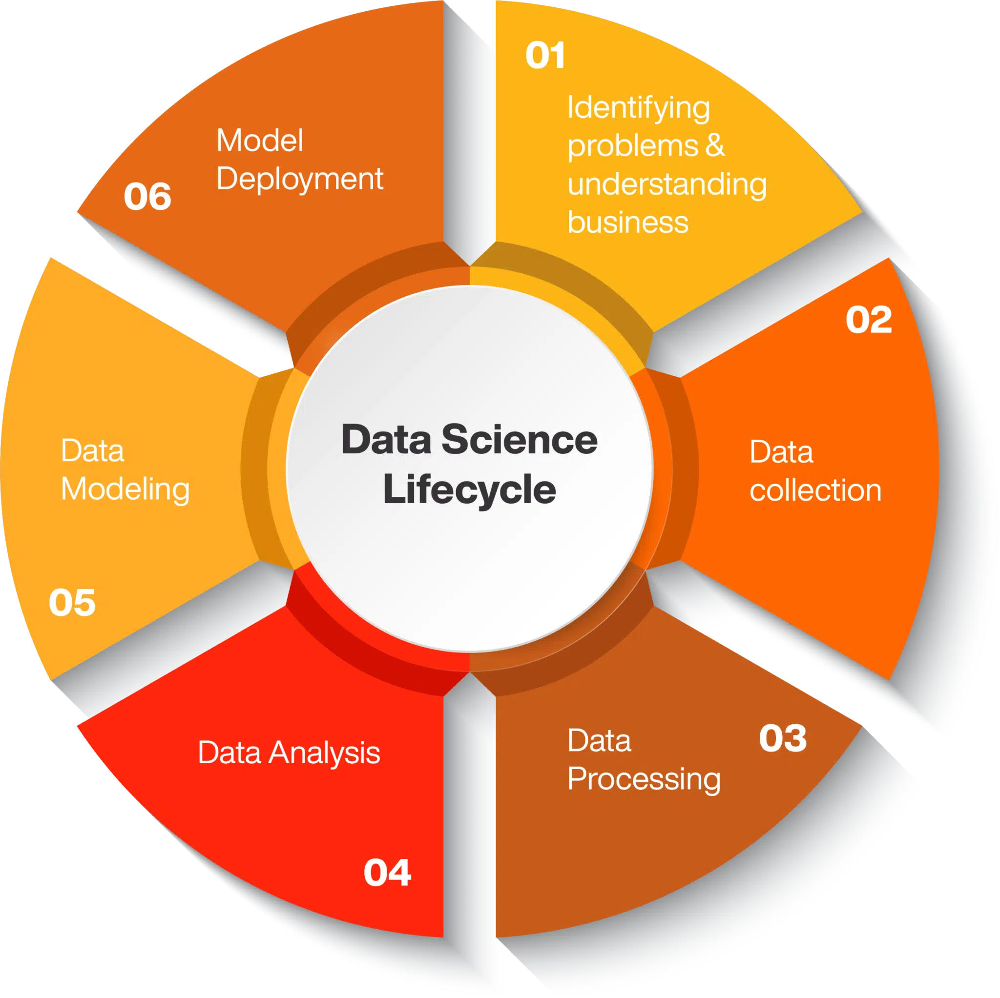

+ Business understanding
+ Data acquisition
+ Data exploration, cleansing, preparation, and visualization
+ Model training and experiment tracking
+ Model scoring and generating insights.

The goals and success criteria of each stage depend on `collaboration`, `data sharing` and `documentation`. The Fabric data science experience consists of multiple native-built features that enable collaboration, data acquisition, sharing, and consumption in a seamless way.

In these tutorials, you take the role of a data scientist who has been given the task **`to explore, clean, and transform a dataset`** containing the <font color=red>churn status</font> of 10,000 customers at a bank. You then **<font color=green>build a machine learning model to predict which bank customers are likely to leave</font>**.

You'll learn to perform the following activities:

1. [Use the Fabric notebooks for data science scenarios](#0.1).
2. [Ingest data into a Fabric lakehouse using Apache Spark](#1).
3. [Load existing data from the lakehouse delta tables](#1.2).
4. [Clean and transform data using Apache Spark and Python based tools](#2.1.4).
5. [Create experiments and runs to train different machine learning models](#3.4).
6. [Register and track trained models using MLflow and the Fabric UI](#3.11).
7. [Run scoring at scale and save predictions and inference results to the lakehouse](#4.5).
8. [Visualize predictions in Power BI using DirectLake](#5).


<a id='0'></a>
# Architecture Data Science
In this tutorial series, we showcase a simplified end-to-end data science scenario that involves:
1. [Prepare environment system on cloud](#0.1)
2. [Ingesting data from an external data source](#1).
3. [Explore and clean data](#2).
4. [Train and register machine learning models](#3).
5. [Perform batch scoring and save predictions](#4).
6. [Visualize prediction results in Power BI](#5).

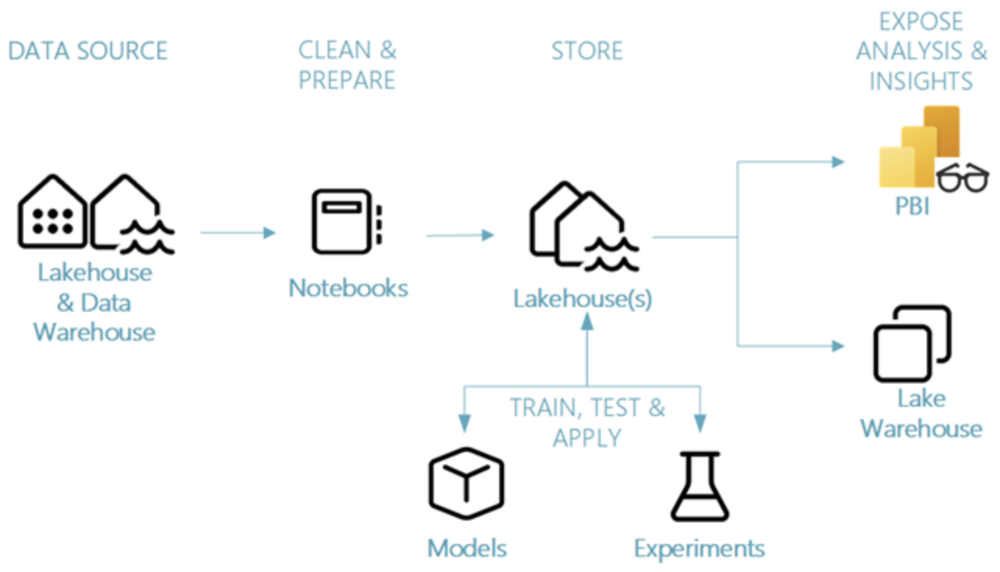

**Data sources** - 
+ Using Fabric Notebooks you can ingest data from the built-in Lakehouse, Data Warehouse, semantic models, and various Apache Spark and Python supported custom data sources.
  
**Explore, clean, and prepare** - 
+ This tutorial will showcase data exploration using Python library `seaborn` and data cleansing and preparation using Apache Spark.

**Models** and **experiments** - 
+ Fabric enables you to train, evaluate, and score machine learning models by using built-in experiment and model items with seamless integration with <a href="https://mlflow.org/docs/latest/index.html">MLflow</a> for experiment tracking and model registration/deployment.
+ Fabric also features capabilities for model prediction at scale (PREDICT) to gain and share business insights.

**Storage** - 
+ Fabric standardizes on <a href="https://docs.delta.io/latest/index.html">Delta Lake</a>,
+ This storage layer allows you to store both structured and unstructured data that support both file-based storage and tabular format.
+ The datasets and files stored can be easily accessed via `notebooks` and `pipelines`.

**Expose analysis and insights** - 
+ Data from a lakehouse can be consumed by `Power BI`, industry leading business intelligence tool, for reporting and visualization.
+ Data persisted in the lakehouse can also be visualized in notebooks using Spark or Python native visualization libraries like `matplotlib`, `seaborn`, `plotly`, and more. 


Sources : ( <a href="http://localhost:8888/notebooks/Study_burhanudin_6/Data%20Analytics/Microsoft%20Azure/Data%20Science%20in%20Microsoft%20Fabric.ipynb">Get started with data science in Microsoft Fabric</a> )

[Introduction...](#0.0)
<a id='0.1'></a>
# Prepare your system for data science tutorials

## Prerequisites
+ Get a Microsoft Fabric subscription. Or, sign up for a free Microsoft Fabric trial.
+ Sign in to <a href="https://app.fabric.microsoft.com/">Microsoft Fabric</a>.
+ Use the experience switcher on the left side of your home page to switch to the **Synapse Data Science** experience.
  
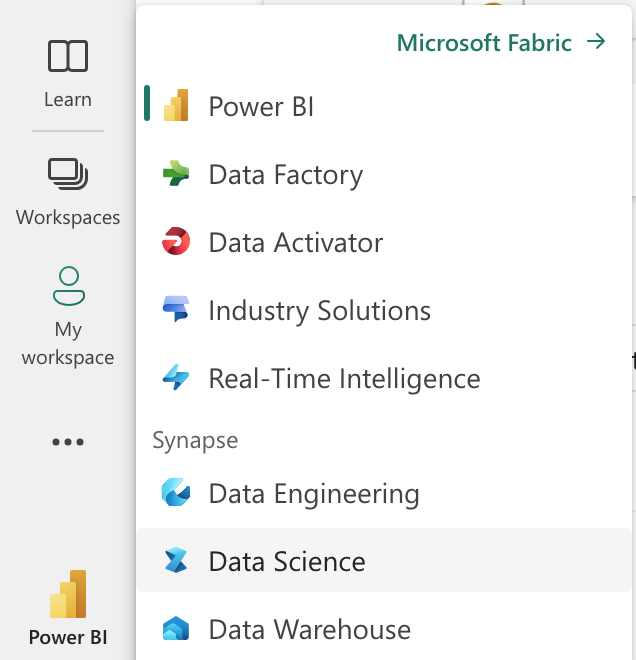
+ If you don't have a Microsoft Fabric lakehouse, create one by following the steps in <a href="https://learn.microsoft.com/en-us/fabric/data-engineering/create-lakehouse">Create a lakehouse in Microsoft Fabric</a>.

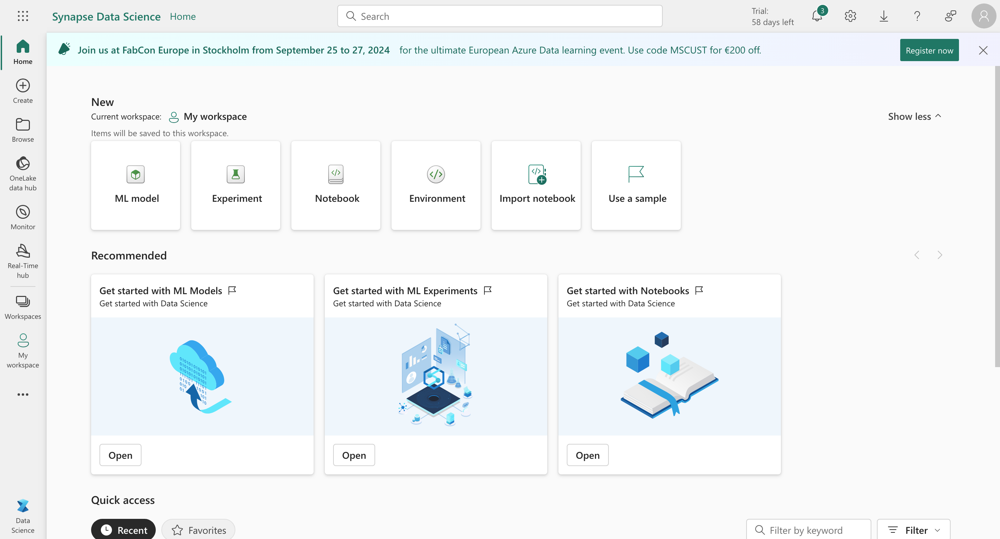

## Import tutorial notebooks
The notebooks are available as Jupyter notebook files that can be imported to your Fabric-enabled workspace.

1. Download your notebook(s). Make sure to download the files by using the "Raw" file link in GitHub.

    + For the **Get started** notebooks, download the notebook(.ipynb) files from the parent folder: <a href="https://github.com/microsoft/fabric-samples/tree/main/docs-samples/data-science/data-science-tutorial">data-science-tutorial</a>.
    + For the **Tutorials** notebooks, download the notebooks(.ipynb) files from the parent folder <a href="https://github.com/microsoft/fabric-samples/tree/main/docs-samples/data-science/ai-samples">ai-samples</a>.
2. On the Data science experience homepage, select **Import notebook** and upload the notebook files that you downloaded in `step 1`.
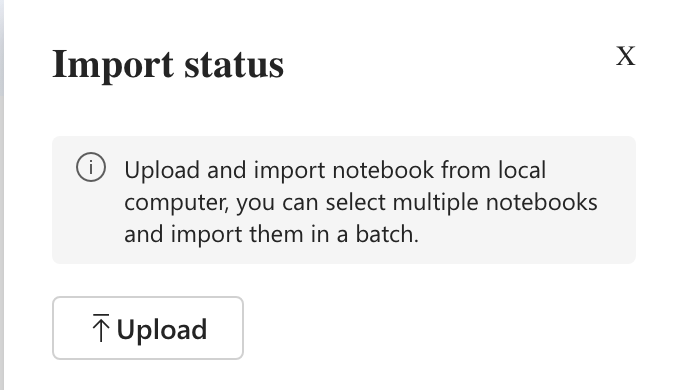

3. Once the notebooks are imported, select **Go to workspace** in the import dialog box.
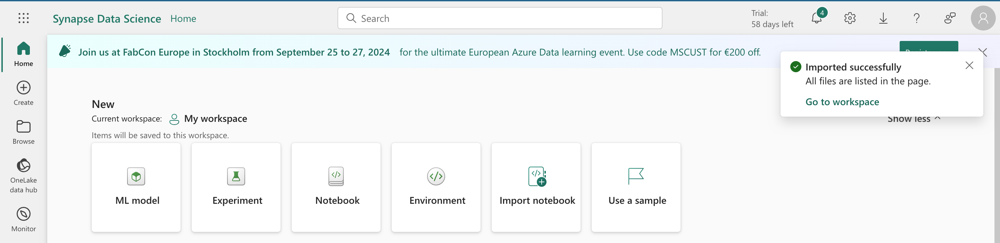

4. The imported notebooks are now available in your workspace for use.

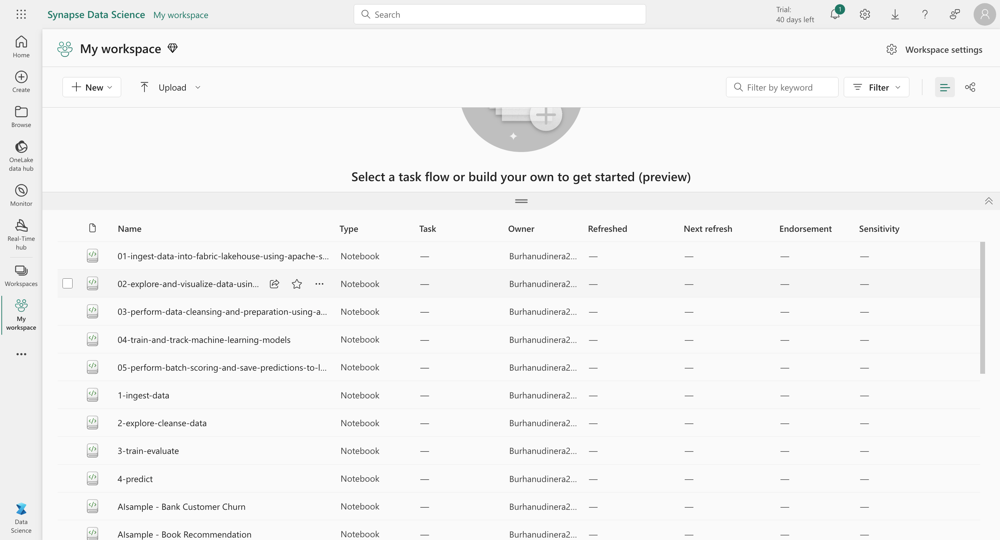

5. If the imported notebook includes output, select the Edit menu, then select Clear all outputs.
   

<a id='0.2'></a>
## Attach a lakehouse to the notebooks
To demonstrate Fabric lakehouse features, many of the tutorials require attaching a default lakehouse to the notebooks. The following steps show how to add a lakehouse to a notebook in a Fabric-enabled workspace.

<div class="alert alert-block alert-info">Note

Before executing each notebooks, you need to perform these steps on that notebook.</div>

1. Open the notebook in the workspace.

2. Select **Add lakehouse** in the left pane.
3. Create a new lakehouse or use an existing lakehouse.

    + To create a new lakehouse, select **New**. Give the lakehouse a name and select **Create**.
    
    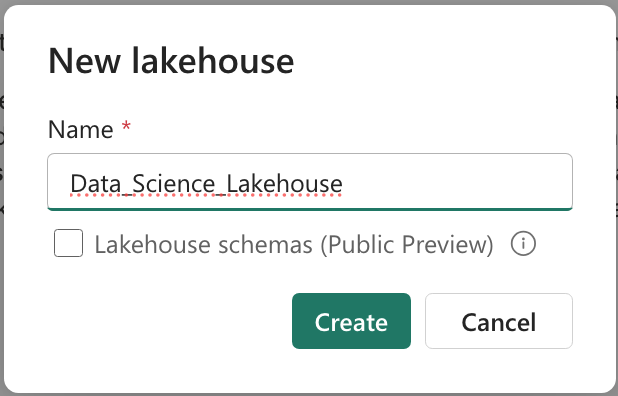
    
    + To use an existing lakehouse, select **Existing lakehouse** to open the **Data hub** dialog box. Select the lakehouse you want to use and then select **Add**.
4. Once a lakehouse is added, it's visible in the lakehouse pane and you can view tables and files stored in the lakehouse.

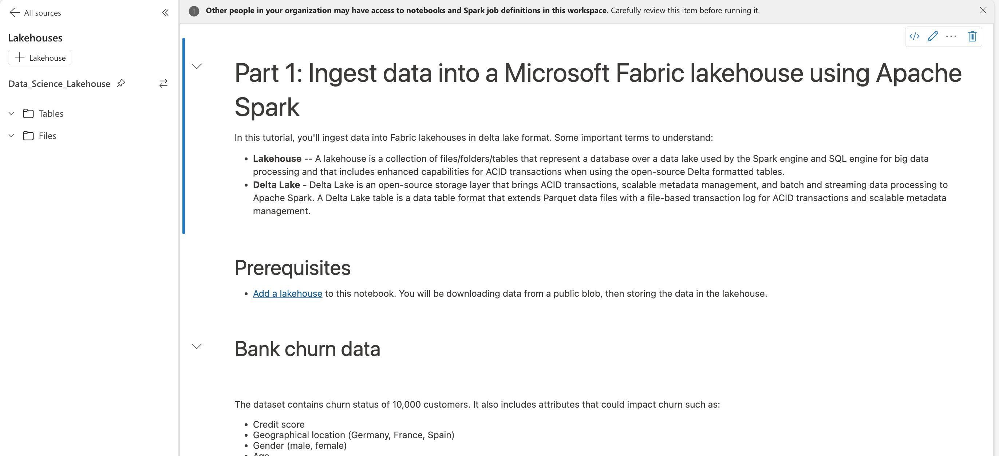

[Architecture...](#0)


<a id='1'></a>
# Tutorial Part 1: Ingest data into a Microsoft Fabric lakehouse using Apache Spark

1. [Follow along in notebook](#1.1)
2. [Bank churn data](#1.2)

In this tutorial, you'll ingest data into Fabric lakehouses in delta lake format. Some important terms to understand:

+ **Lakehouse** - A lakehouse is a collection of files/folders/tables that represent a database over a data lake used by the Spark engine and SQL engine for big data processing and that includes enhanced capabilities for ACID transactions when using the open-source Delta formatted tables.

+  **Delta lake** - Delta Lake is an open-source storage layer that brings ACID transactions, scalable metadata management, and batch and streaming data processing to Apache Spark. A Delta Lake table is a data table format that extends Parquet data files with a file-based transaction log for ACID transactions and scalable metadata management.

+ <a href="https://learn.microsoft.com/en-us/azure/open-datasets/overview-what-are-open-datasets">Azure Open Datasets</a> are curated public datasets you can use to add scenario-specific features to machine learning solutions for more accurate models. Open Datasets are in the cloud on Microsoft Azure Storage and can be accessed by various methods including Apache Spark, REST API, Data factory, and other tools.

In this tutorial, you use the Apache Spark to:

+ Read data from Azure Open Datasets containers.
+ Write data into a Fabric lakehouse delta table.

[Part 1....](#1)
<a id='1.1'></a>
## 1.1. Follow along in notebook
+ <a href="https://github.com/microsoft/fabric-samples/blob/main/docs-samples/data-science/data-science-tutorial/1-ingest-data.ipynb">1-ingest-data.ipynb</a> is the notebook that accompanies this tutorial.

+ To open the accompanying notebook for this tutorial, follow the instructions in Prepare your system for data science tutorials, to import the notebook to your workspace.

+ If you'd rather copy and paste the code from this page, you can create a new notebook.

+ Be sure to attach a lakehouse to the notebook before you start running code.

[Part 1....](#1)
<a id='1.2'></a>
## 1.2. Bank churn data
The dataset contains churn status of 10,000 customers. It also includes attributes that could impact churn such as:

+ Credit score
+ Geographical location (Germany, France, Spain)
+ Gender (male, female)
+ Age
+ Tenure (years of being bank's customer)
+ Account balance
+ Estimated salary
+ Number of products that a customer has purchased through the bank
+ Credit card status (whether a customer has a credit card or not)
+ Active member status (whether an active bank's customer or not)
The dataset also includes columns such as row number, customer ID, and customer surname that should have no impact on customer's decision to leave the bank.

The event that defines the customer's churn is the closing of the customer's bank account. The column `exited` in the dataset refers to customer's abandonment. There isn't much context available about these attributes so you have to proceed without having background information about the dataset. The aim is to understand how these attributes contribute to the exited status.

Example rows from the dataset:
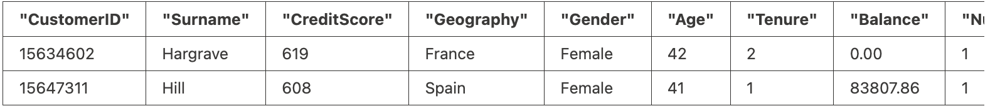

## Download dataset and upload to lakehouse

<div class="alert alert-block alert-info">Tip
    
By defining the following parameters, you can use this notebook with different datasets easily.</div>
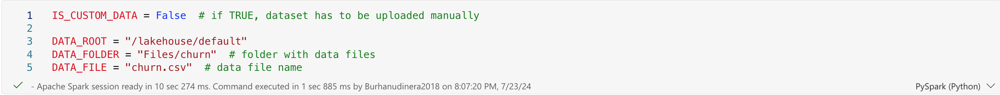

This code downloads a publicly available version of the dataset and then stores it in a Fabric lakehouse.


<div class="alert alert-block alert-danger">Important !!!

Make sure you [add a lakehouse](https://learn.microsoft.com/en-us/fabric/data-science/tutorial-data-science-prepare-system#attach-a-lakehouse-to-the-notebooks) to the notebook before running it. Failure to do so will result in an error.</div>

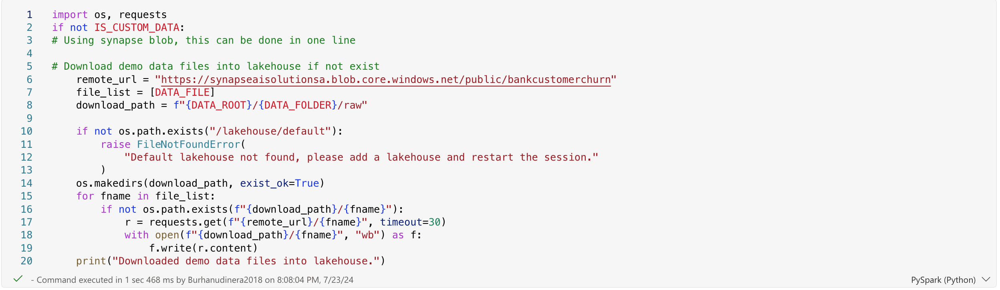

[Architecture....](#0)
<a id='2'></a>
# Part 2: Explore and visualize data using Microsoft Fabric notebooks
1. [Follow along in notebook](#2.1)
2. [Drop duplicate rows](#2.2)
3. [Drop rows with missing data](#2.3)
4. [Drop columns](#2.4)
5. [Add code to notebook](#2.5)
6. [Explore the data](#2.6)
   



[Part 2....](#2)
<a id='2.1'></a>
## 2.1. Follow along in notebook
[2-explore-cleanse-data.ipynb](https://github.com/microsoft/fabric-samples/blob/main/docs-samples/data-science/data-science-tutorial/2-explore-cleanse-data.ipynb) is the notebook that accompanies this tutorial.

To open the accompanying notebook for this tutorial, follow the instructions in [Prepare your system for data science tutorials](https://learn.microsoft.com/en-us/fabric/data-science/tutorial-data-science-prepare-system#import-tutorial-notebooks), to import the notebook to your workspace.

If you'd rather copy and paste the code from this page, you can create a new notebook.

Be sure to [attach a lakehouse](https://learn.microsoft.com/en-us/fabric/data-science/tutorial-data-science-prepare-system#attach-a-lakehouse-to-the-notebooks) to the notebook before you start running code.

<div class="alert alert-block alert-danger">Important !!!

[Attach the same lakehouse you used in Part 1](#1).</div>

[Part 2....](#2)
<a id='2.1.1'></a>
### 2.1.1. Read raw data from the lakehouse
Read raw data from the Files section of the lakehouse. You uploaded this data in the previous notebook. Make sure you have attached the same lakehouse you used in Part 1 to this notebook before you run this code.
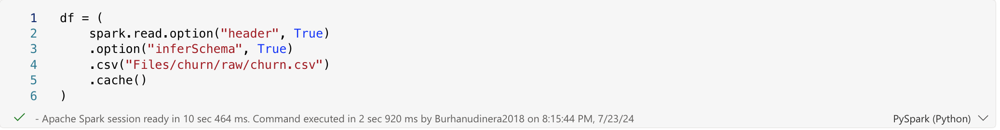

[Part 2....](#2)
<a id='2.1.2'></a>
### 2.1.2. Create a pandas DataFrame from the dataset
Convert the spark DataFrame to pandas DataFrame for easier processing and visualization.
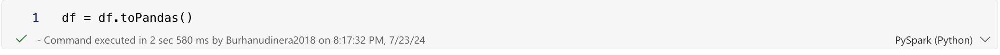

[Part 2....](#2)
<a id='2.1.3'></a>
### 2.1.3. Display raw data
Explore the raw data with display, do some basic statistics and show chart views. Note that you first need to import the required libraries such as `Numpy`, `Pnadas`, `Seaborn`, and `Matplotlib` for data analysis and visualization.

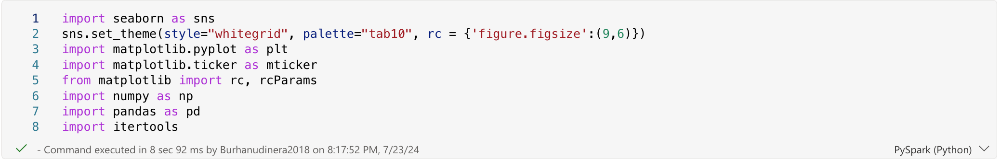

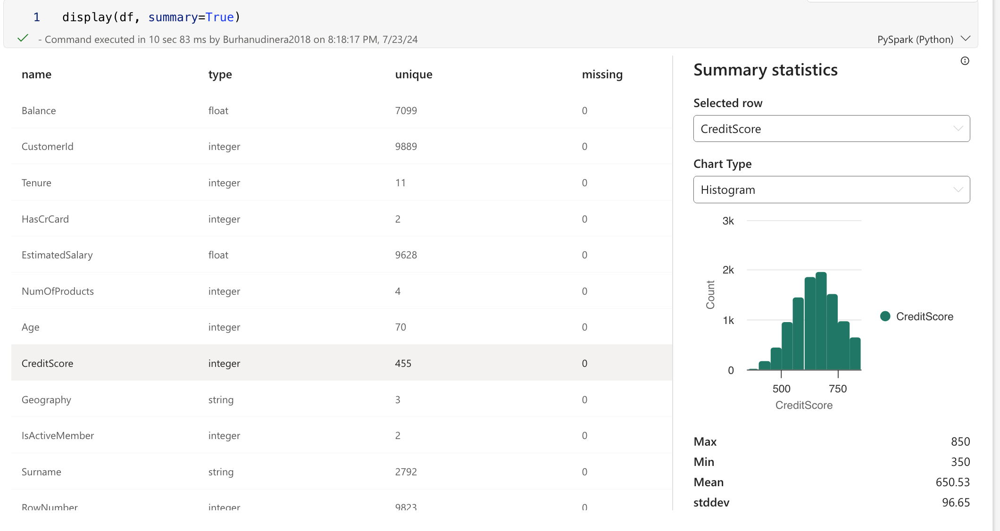

[Part 2....](#2)
<a id='2.1.4'></a>
### 2.1.4. Use Data Wrangler to perform initial data cleaning
To explore and transform any pandas Dataframes in your notebook, launch Data Wrangler directly from the notebook.

<div class="alert alert-block alert-info"> Note

Data Wrangler can not be opened while the notebook kernel is busy. The cell execution must complete prior to launching Data Wrangler </div>

1. Under the notebook ribbon **Data** tab, select **Launch Data Wrangler**. You'll see a list of activated pandas DataFrames available for editing.
2. Select the DataFrame you wish to open in Data Wrangler. Since this notebook only contains one DataFrame, `df`, select `df`.

   Data Wrangler launches and generates a descriptive overview of your data. The table in the middle shows each data column. The <Font color=blue>Summary</Font> panel next to the table shows information about the DataFrame. When you select a column in the table, the summary updates with information about the selected column. In some instances, the data displayed and summarized will be a truncated view of your DataFrame. When this happens, you'll see warning image in the summary pane. Hover over this warning to view text explaining the situation.


   Each operation you do can be applied in a matter of clicks, updating the data display in real time and generating code that you can save back to your notebook as a reusable function.

    The rest of this section walks you through the steps to perform data cleaning with Data Wrangler.

[Part 2....](#2)
<a id='2.2'></a>
## 2.2. Drop duplicate rows
On the left panel is a list of operations (such as **Find and replace, Format, Formulas, Numeric**) you can perform on the dataset.

1. Expand **Find and replace** and select **Drop duplicate rows**.

2. A panel appears for you to select the list of columns you want to compare to define a duplicate row. Select **RowNumber** and **CustomerId**.

In the middle panel is a preview of the results of this operation. Under the preview is the code to perform the operation. In this instance, the data appears to be unchanged. But since you're looking at a truncated view, it's a good idea to still apply the operation.

3. Select **Apply** (either at the side or at the bottom) to go to the next step.

[Part 2....](#2)
<a id='2.3'></a>
## 2.3. Drop rows with missing data
Use Data Wrangler to drop rows with missing data across all columns.

1. Select **Drop missing values** from **Find and replace**.

2. Choose **Select all** from the **Target columns**.

3. Select **Apply** to go on to the next step.

[Part 2....](#2)
<a id='2.4'></a>
## 2.4. Drop columns
Use Data Wrangler to drop columns that you don't need.

1. Expand **Schema** and select **Drop columns**.

2. Select **RowNumber**, **CustomerId**, **Surname**. These columns appear in red in the preview, to show they're changed by the code (in this case, dropped.)

3. Select Apply to go on to the next step.

[Part 2....](#2)
<a id='2.5'></a>
## 2.5. Add code to notebook
Each time you select **Apply**, a new step is created in the **Cleaning steps** panel on the bottom left. At the bottom of the panel, select **Preview code for all steps** to view a combination of all the separate steps.

Select **Add code to notebook** at the top left to close Data Wrangler and add the code automatically. The **Add code to notebook** wraps the code in a function, then calls the function.

<div class="alert alert-block alert-info">Tip

The code generated by Data Wrangler won't be applied until you manually run the new cell.</div>

If you didn't use Data Wrangler, you can instead use this next code cell.

This code is similar to the code produced by Data Wrangler, but adds in the argument `inplace=True` to each of the generated steps. By setting `inplace=True`, pandas will overwrite the original DataFrame instead of producing a new DataFrame as an output.

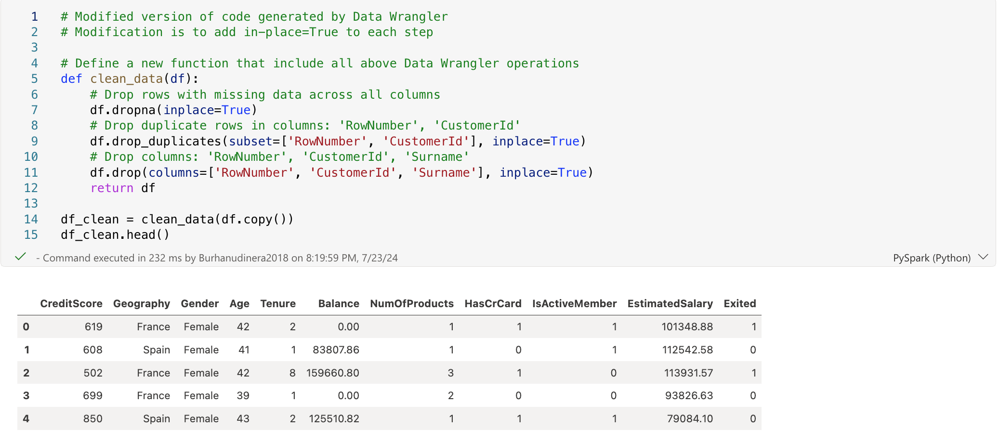

[Part 2....](#2)
<a id='2.6'></a>
## 2.6. Explore the data
Display some summaries and visualizations of the cleaned data.

### Determine categorical, numerical, and target attributes
Use this code to determine categorical, numerical, and target attributes.
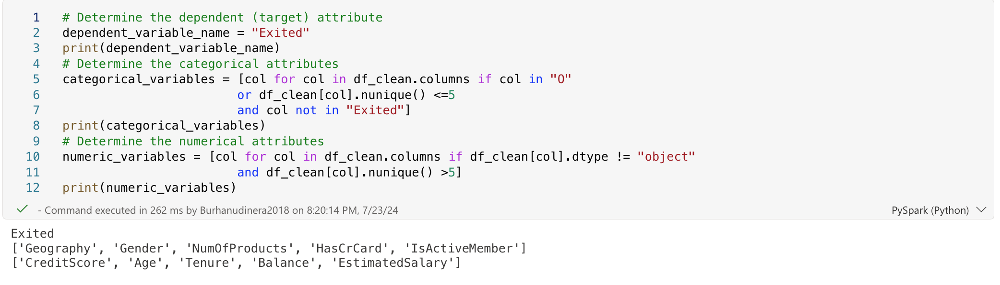

### The five-number summary
Show the five-number summary (the minimum score, first quartile, median, third quartile, the maximum score) for the numerical attributes, using box plots.
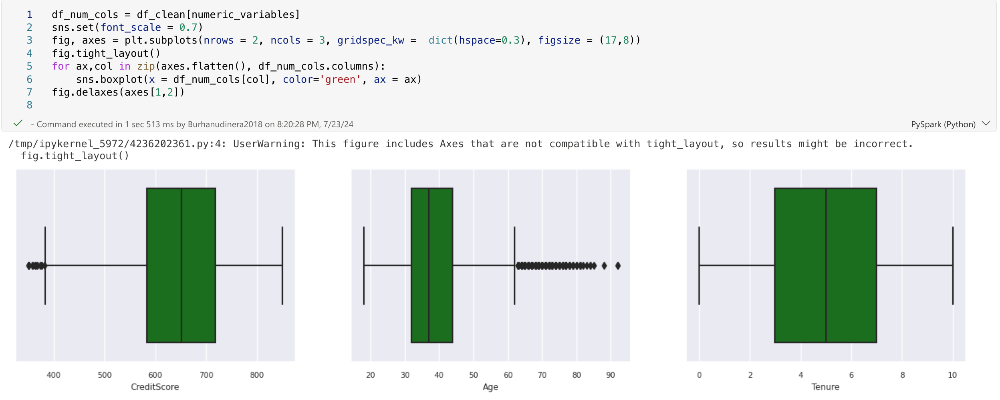

### Distribution of exited and nonexited customers
Show the distribution of exited versus nonexited customers across the categorical attributes.
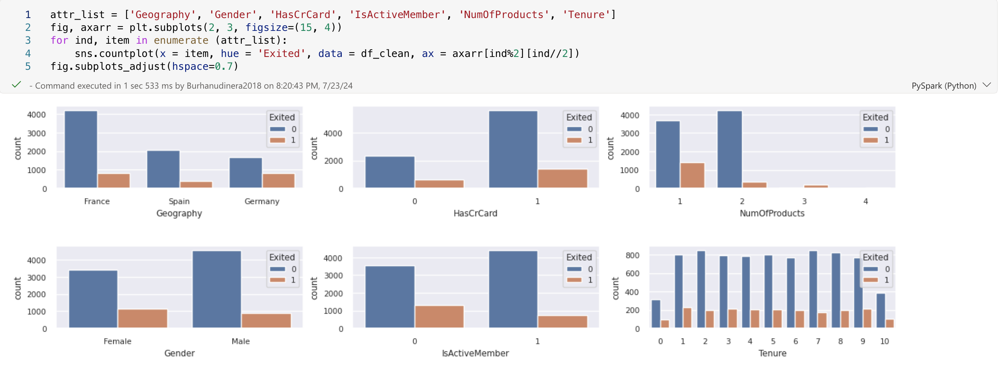

### Distribution of numerical attributes
Show the frequency distribution of numerical attributes using histogram.
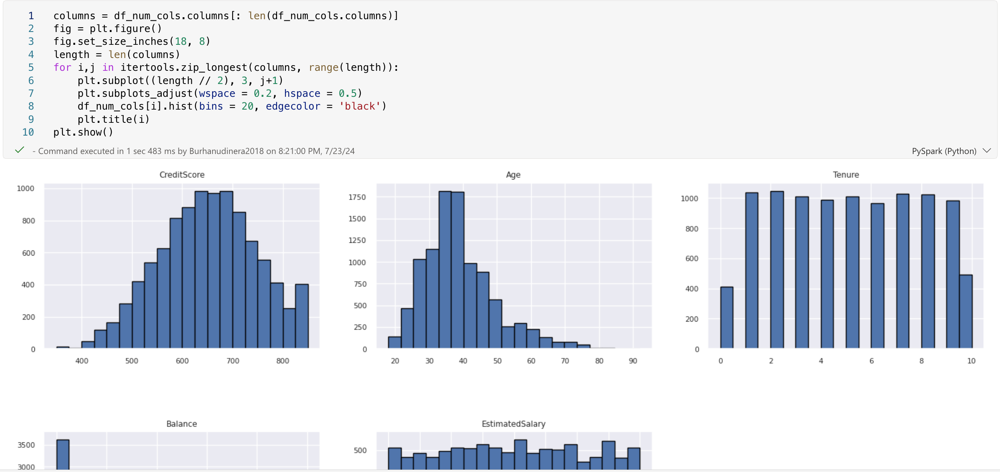

### Perform feature engineering
Perform feature engineering to generate new attributes based on current attributes:
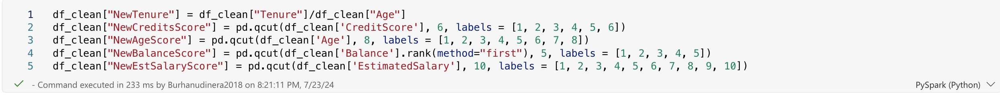

### Use Data Wrangler to perform one-hot encoding
Data Wrangler can also be used to perform one-hot encoding. To do so, re-open Data Wrangler. This time, select the `df_clean` data.

1. Expand **Formulas** and select **One-hot encode**.
2. A panel appears for you to select the list of columns you want to perform one-hot encoding on. Select **Geography** and **Gender**.

You could copy the generated code, close Data Wrangler to return to the notebook, then paste into a new cell. Or, select Add code to notebook at the top left to close Data Wrangler and add the code automatically.

If you didn't use Data Wrangler, you can instead use this next code cell:

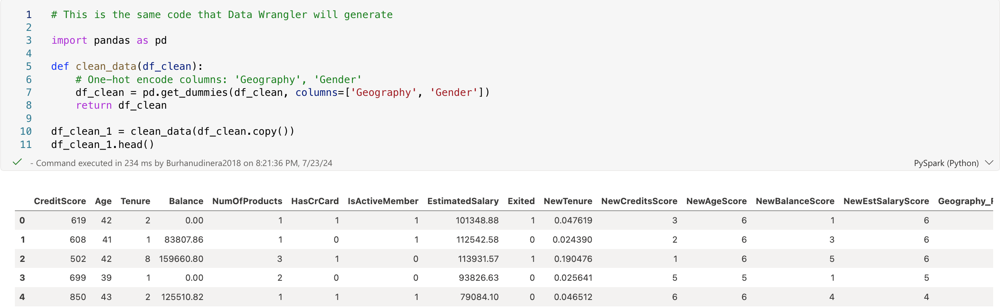

### Summary of observations from the exploratory data analysis
+ Most of the customers are from France comparing to Spain and Germany, while Spain has the lowest churn rate comparing to France and Germany.
+ Most of the customers have credit cards.
+ There are customers whose age and credit score are above 60 and below 400, respectively, but they can't be considered as outliers.
+ Very few customers have more than two of the bank's products.
+ Customers who aren't active have a higher churn rate.
+ Gender and tenure years don't seem to have an impact on customer's decision to close the bank account.

## Create a delta table for the cleaned data
You'll use this data in the next notebook of this series.
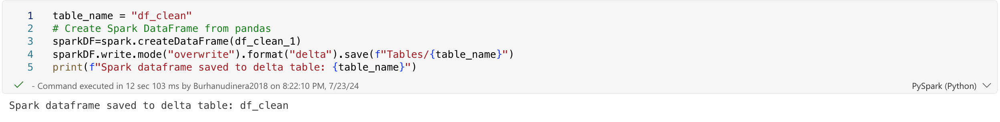


[Architecture....](#0)
<a id='3'></a>
# Part 3: Train and register a machine learning model
1. [Follow along in notebook](#3.1)
2. [Install custom libraries](#3.2)
3. [Load the data](#3.3)
4. [Generate experiment for tracking and logging the model using MLflow](#3.4)
5. [Set experiment and autologging specifications](#3.5)
6. [Import scikit-learn and LightGBM](#3.6)
7. [Prepare training, validation and test datasets](#3.7)
8. [Save test data to a delta table](#3.8)
9. [Apply SMOTE to the training data to synthesize new samples for the minority class](#3.9)
10. [Model training](#3.10)
11. [Experiments artifact for tracking model performance](#3.11)
12. [Assess the performances of the trained models on the validation dataset](#3.12)



In this tutorial, you'll learn to train multiple machine learning models to select the best one in order to predict which bank customers are likely to leave.

In this tutorial, you'll:

+ Train Random Forrest and LightGBM models.
+ Use Microsoft Fabric's native integration with the MLflow framework to log the trained machine learning models, the used hyperaparameters, and evaluation metrics.
+ Register the trained machine learning model.
+ Assess the performances of the trained machine learning models on the validation dataset.
[MLflow](https://mlflow.org/docs/latest/index.html) is an open source platform for managing the machine learning lifecycle with features like Tracking, Models, and Model Registry. MLflow is natively integrated with the Fabric Data Science experience.

[Part 3....](#3)
<a id='3.1'></a>
## 3.1. Follow along in notebook
[3-train-evaluate.ipynb](https://github.com/microsoft/fabric-samples/blob/main/docs-samples/data-science/data-science-tutorial/3-train-evaluate.ipynb) is the notebook that accompanies this tutorial.

To open the accompanying notebook for this tutorial, follow the instructions in Prepare your system for data science tutorials, to import the notebook to your workspace.

If you'd rather copy and paste the code from this page, you can create a new notebook.

Be sure to [attach a lakehouse to the notebook](https://learn.microsoft.com/en-us/fabric/data-science/tutorial-data-science-prepare-system#attach-a-lakehouse-to-the-notebooks) before you start running code.

<div class="alert alert-block alert-danger"> Important

Attach the same lakehouse you used in part 1 and part 2. </div>
 
[Part 3....](#3)
<a id='3.2'></a>
## 3.2. Install custom libraries
For this notebook, you'll install imbalanced-learn (imported as `imblearn`) using `%pip install`. Imbalanced-learn is a library for Synthetic Minority Oversampling Technique (SMOTE) which is used when dealing with imbalanced datasets. The PySpark kernel will be restarted after `%pip install`, so you'll need to install the library before you run any other cells.

You'll access SMOTE using the `imblearn` library. Install it now using the in-line installation capabilities (e.g., `%pip`, `%conda`).
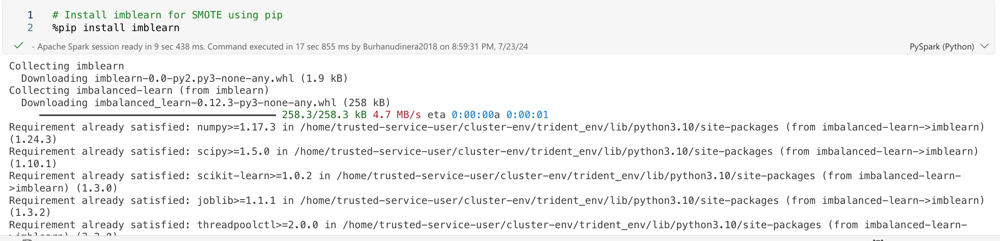

<div class="alert alert-block alert-info"> Important

Run this install each time you restart the notebook.</div>

When you install a library in a notebook, it's only available for the duration of the notebook session and not in the workspace. If you restart the notebook, you'll need to install the library again.

If you have a library you often use, and you want to make it available to all notebooks in your workspace, you can use a [Fabric environment](https://aka.ms/fabric/create-environment) for that purpose. You can create an environment, install the library in it, and then your **workspace admin** can attach the environment to the workspace as its default environment. For more information on setting an environment as the workspace default, see [Admin sets default libraries for the workspace](https://learn.microsoft.com/en-us/fabric/data-engineering/library-management#scenario-1-admin-sets-default-libraries-for-the-workspace).

For information on migrating existing workspace libraries and Spark properties to an environment, see [Migrate workspace libraries and Spark properties to a default environment](https://learn.microsoft.com/en-us/fabric/data-engineering/environment-workspace-migration).

[Part 3....](#3)
<a id='3.3'></a>
## 3.3. Load the data
Prior to training any machine learning model, you need to load the delta table from the lakehouse in order to read the cleaned data you created in the previous notebook.
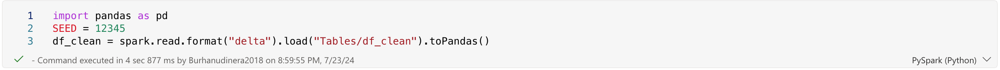

[Part 3....](#3)
<a id='3.4'></a>
## 3.4. Generate experiment for tracking and logging the model using MLflow
This section demonstrates how to generate an experiment, specify the machine learning model and training parameters as well as scoring metrics, train the machine learning models, log them, and save the trained models for later use.
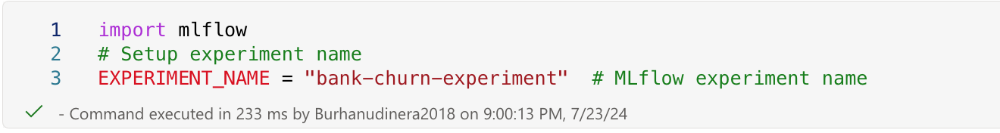

Extending the MLflow autologging capabilities, autologging works by automatically capturing the values of input parameters and output metrics of a machine learning model as it is being trained. This information is then logged to your workspace, where it can be accessed and visualized using the MLflow APIs or the corresponding experiment in your workspace.

All the experiments with their respective names are logged and you'll be able to track their parameters and performance metrics. To learn more about autologging, see Autologging in Microsoft Fabric.

[Part 3....](#3)
<a id='3.5'></a>
## 3.5. Set experiment and autologging specifications
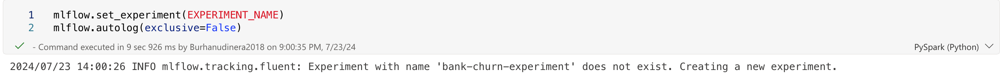

[Part 3....](#3)
<a id='3.6'></a>
## 3.6. Import scikit-learn and LightGBM
With your data in place, you can now define the machine learning models. You'll apply Random Forrest and LightGBM models in this notebook. Use scikit-learn and lightgbm to implement the models within a few lines of code.
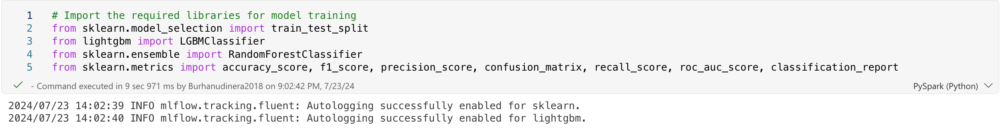

[Part 3....](#3)
<a id='3.7'></a>
## 3.7. Prepare training, validation and test datasets
Use the train_test_split function from scikit-learn to split the data into training, validation, and test sets.
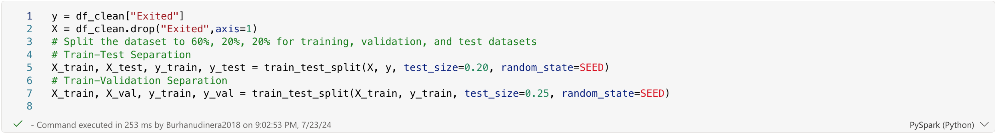

[Part 3....](#3)
<a id='3.8'></a>
## 3.8. Save test data to a delta table
Save the test data to the delta table for use in the next notebook.
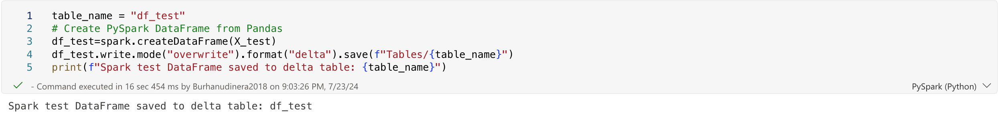

[Part 3....](#3)
<a id='3.9'></a>
## 3.9. Apply SMOTE to the training data to synthesize new samples for the minority class
The data exploration in part 2 showed that out of the 10,000 data points corresponding to 10,000 customers, only 2,037 customers (around 20%) have left the bank. This indicates that the dataset is highly imbalanced. The problem with imbalanced classification is that there are too few examples of the minority class for a model to effectively learn the decision boundary. SMOTE is the most widely used approach to synthesize new samples for the minority class. Learn more about SMOTE here and here.

<div class="alert alert-block alert-info">Tip

Note that SMOTE should only be applied to the training dataset. You must leave the test dataset in its original imbalanced distribution in order to get a valid approximation of how the machine learning model will perform on the original data, which is representing the situation in production.</div>
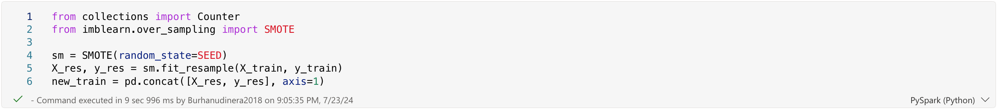


<div class="alert alert-block alert-info"> Tip

You can safely ignore the MLflow warning message that appears when you run this cell. If you see a ModuleNotFoundError message, you missed running the first cell in this notebook, which installs the imblearn library. You need to install this library each time you restart the notebook. Go back and re-run all the cells starting with the first cell in this notebook.   </div>

[Part 3....](#3)
<a id='3.10'></a>
## 3.10. Model training
+ Train the model using Random Forest with maximum depth of 4 and 4 features
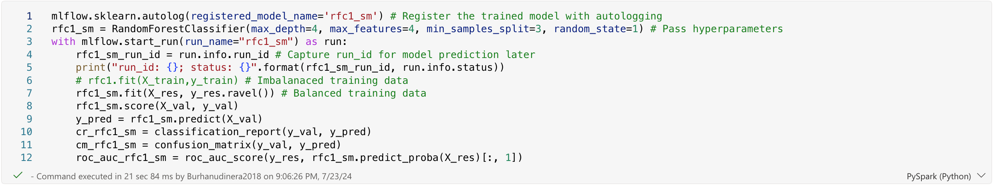
+ Train the model using Random Forest with maximum depth of 8 and 6 features
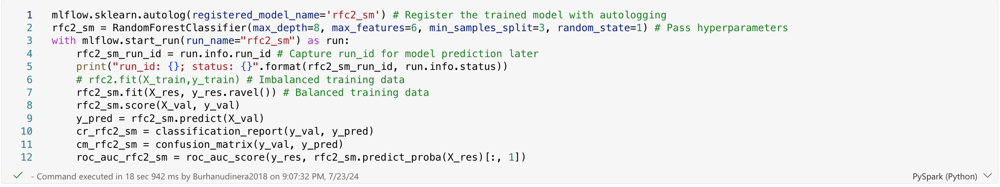
+ Train the model using LightGBM
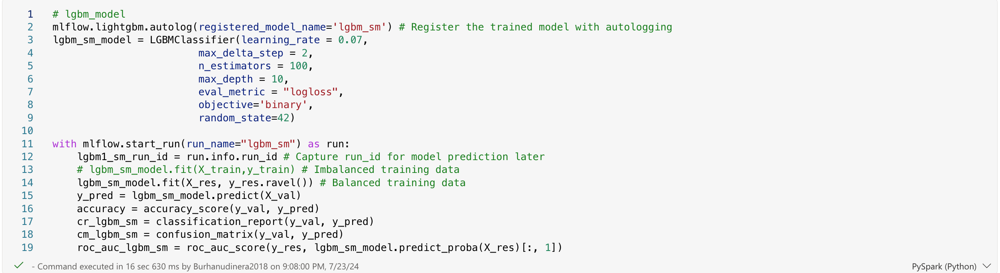
[Part 3....](#3)
<a id='3.11'></a>
## 3.11. Experiments artifact for tracking model performance
The experiment runs are automatically saved in the experiment artifact that can be found from the workspace. They're named based on the name used for setting the experiment. All of the trained machine learning models, their runs, performance metrics, and model parameters are logged.

To view your experiments:

1. On the left panel, select your workspace.

2. On the top right, filter to show only experiments, to make it easier to find the experiment you're looking for.

3. Find and select the experiment name, in this case bank-churn-experiment. If you don't see the experiment in your workspace, refresh your browser.

[Part 3....](#3)
<a id='3.12'></a>
## 3.12. Assess the performances of the trained models on the validation dataset
Once done with machine learning model training, you can assess the performance of trained models in two ways.

+ Open the saved experiment from the workspace, load the machine learning models, and then assess the performance of the loaded models on the validation dataset.
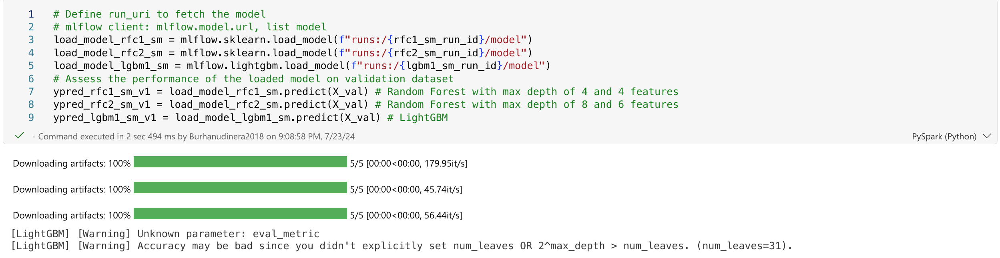
+ Directly assess the performance of the trained machine learning models on the validation dataset.
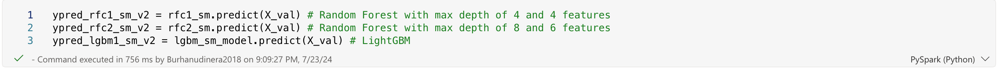
Depending on your preference, either approach is fine and should offer identical performances. In this notebook, you'll choose the first approach in order to better demonstrate the MLflow autologging capabilities in Microsoft Fabric.

Show True/False Positives/Negatives using the Confusion Matrix
Next, you'll develop a script to plot the confusion matrix in order to evaluate the accuracy of the classification using the validation dataset. The confusion matrix can be plotted using SynapseML tools as well, which is shown in Fraud Detection sample that is available [here](https://aka.ms/samples/frauddectection).
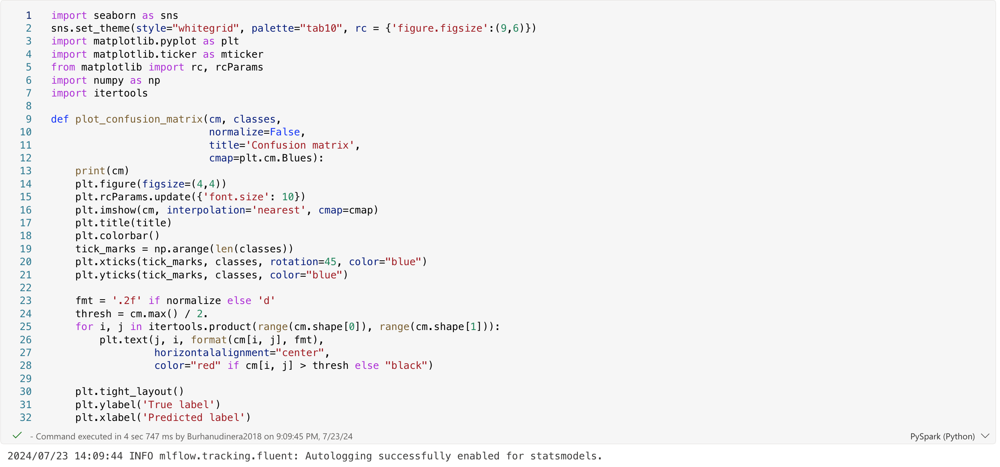
+ Confusion Matrix for Random Forest Classifier with maximum depth of 4 and 4 features
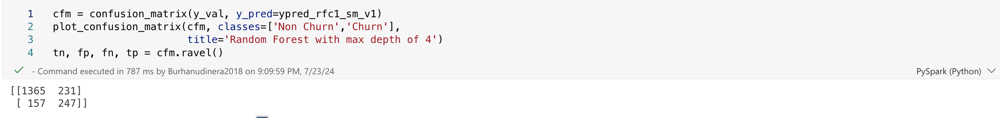
+ Confusion Matrix for Random Forest Classifier with maximum depth of 8 and 6 features
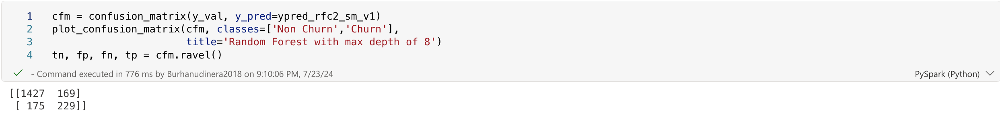
+ Confusion Matrix for LightGBM
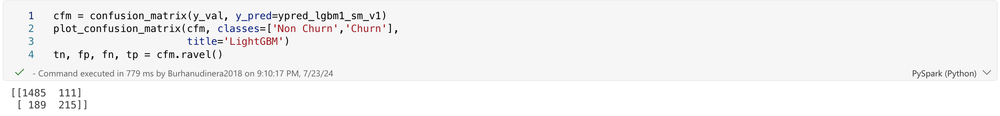


[Architecture....](#0)
<a id='4'></a>
# Part 4: Perform batch scoring and save predictions to a lakehouse
1. [Follow along in notebook](#4.1)
2. [PREDICT with the Transformer API](#4.2)
3. [PREDICT with the Spark SQL API](#4.3)
4. [PREDICT with a user-defined function (UDF)](#4.4)
5. [Write model prediction results to the lakehouse](#4.5)

In this tutorial, you'll learn to import the registered LightGBMClassifier model that was trained in part 3 using the Microsoft Fabric MLflow model registry, and perform batch predictions on a test dataset loaded from a lakehouse.

Microsoft Fabric allows you to operationalize machine learning models with a scalable function called PREDICT, which supports batch scoring in any compute engine. You can generate batch predictions directly from a Microsoft Fabric notebook or from a given model's item page. Learn about PREDICT.

To generate batch predictions on the test dataset, you'll use version 1 of the trained LightGBM model that demonstrated the best performance among all trained machine learning models. You'll load the test dataset into a spark DataFrame and create an MLFlowTransformer object to generate batch predictions. You can then invoke the PREDICT function using one of following three ways:

+ Transformer API from SynapseML
+ Spark SQL API
+ PySpark user-defined function (UDF)

[Part 4....](#4)
<a id='4.1'></a>
## 4.1. Follow along in notebook
4-predict.ipynb is the notebook that accompanies this tutorial.

To open the accompanying notebook for this tutorial, follow the instructions in Prepare your system for data science tutorials, to import the notebook to your workspace.

If you'd rather copy and paste the code from this page, you can create a new notebook.

Be sure to attach a lakehouse to the notebook before you start running code.

<div class="alert alert-block alert-danger">
 Important

Attach the same lakehouse you used in the other parts of this series.</div>

### Load the test data
Load the test data that you saved in Part 3.

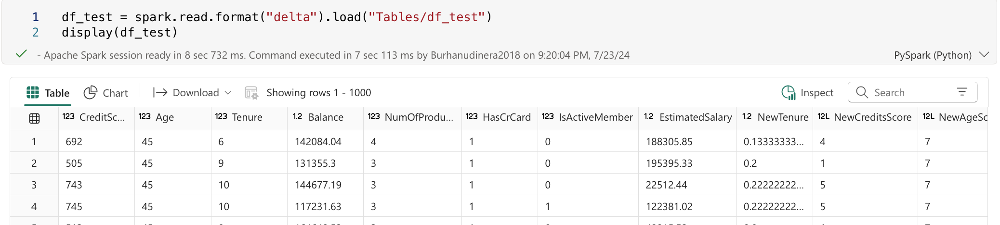

[Part 4....](#4)
<a id='4.2'></a>
## 4.2. PREDICT with the Transformer API
To use the Transformer API from SynapseML, you'll need to first create an MLFlowTransformer object.

Instantiate MLFlowTransformer object
The MLFlowTransformer object is a wrapper around the MLFlow model that you registered in Part 3. It allows you to generate batch predictions on a given DataFrame. To instantiate the MLFlowTransformer object, you'll need to provide the following parameters:

The columns from the test DataFrame that you need as input to the model (in this case, you would need all of them).
A name for the new output column (in this case, predictions).
The correct model name and model version to generate the predictions (in this case, lgbm_sm and version 1).
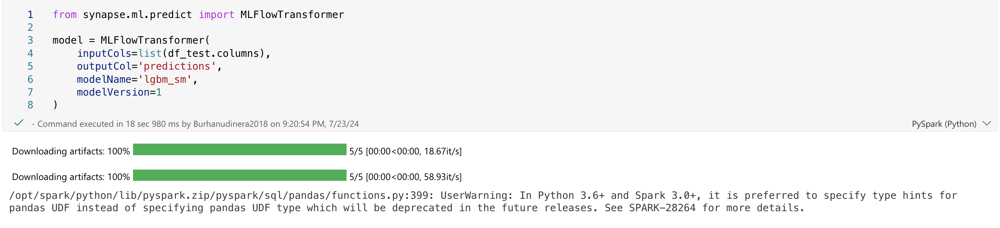

Now that you have the MLFlowTransformer object, you can use it to generate batch predictions.
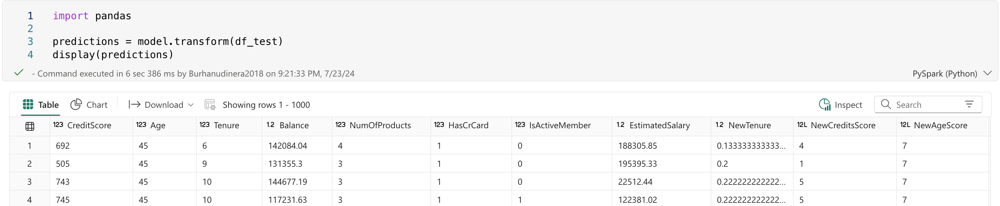

[Part 4....](#4)
<a id='4.3'></a>
## 4.3. PREDICT with the Spark SQL API
The following code invokes the PREDICT function with the Spark SQL API.
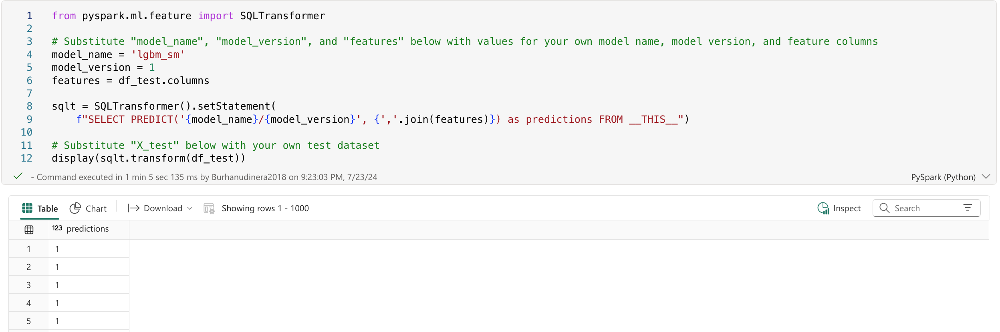
[Part 4....](#4)
<a id='4.4'></a>
## 4.4. PREDICT with a user-defined function (UDF)
The following code invokes the PREDICT function with a PySpark UDF.
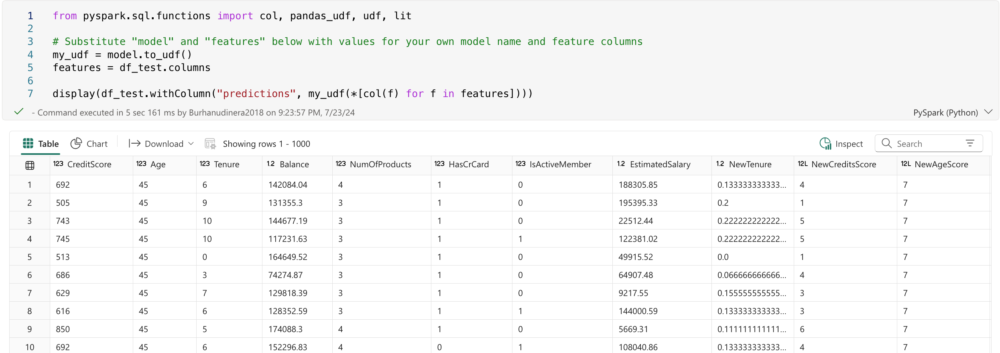
<div class="alert alert-block alert-info">
Note 
That you can also generate PREDICT code from a model's item page. Learn about PREDICT.</div>

[Part 4....](#4)
<a id='4.5'></a>
## 4.5. Write model prediction results to the lakehouse
Once you have generated batch predictions, write the model prediction results back to the lakehouse.
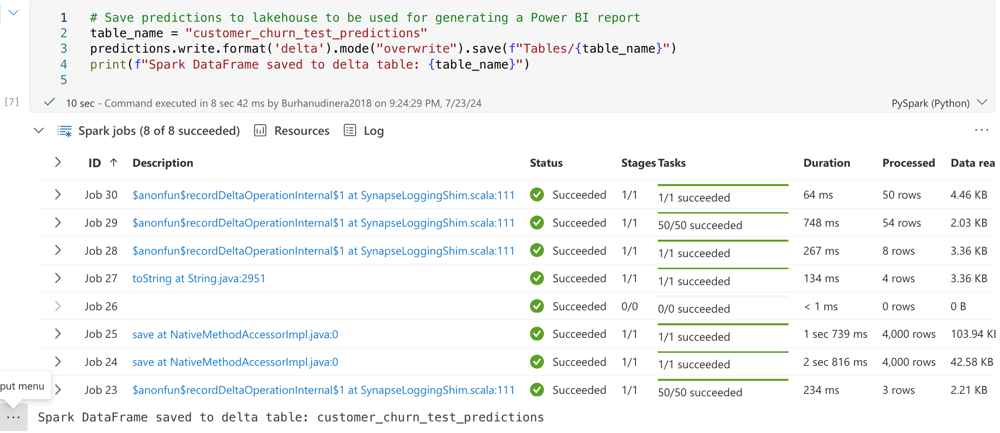



[Architecture....](#0)
<a id='5'></a>
# Part 5: Visualize predictions with a Power BI report
1. [Create a semantic model](#5.1)
2. [Add new measures](#5.2)
3. [Create new report](#5.3)
   

You'll learn how to:

+ Create a semantic model from the predictions data.
+ Add new measures to the data from Power BI.
+ Create a Power BI report.
+ Add visualizations to the report.

[Part 5....](#5)
<a id='5.1'></a>
## 5.1. Create a semantic model
Create a new semantic model linked to the predictions data you produced in part 4:

1. On the left, select your workspace.
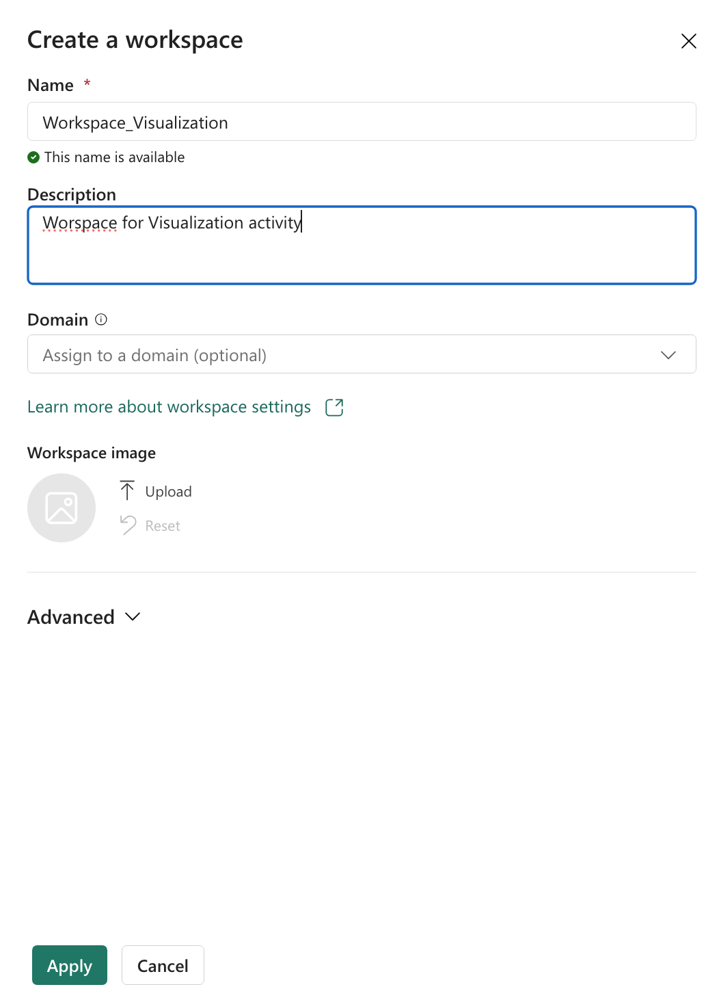

2. On the top left, select Lakehouse as a filter.

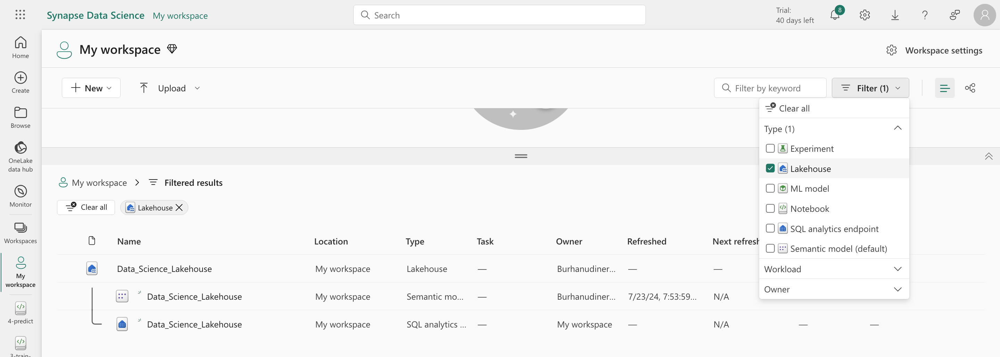

3. Select the lakehouse that you used in the previous parts of the tutorial series.

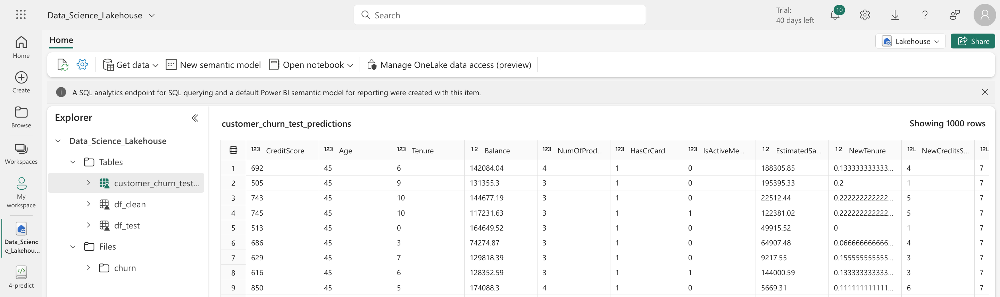

4. Select New semantic model on the top ribbon.


5. Give the semantic model a name, such as "bank churn predictions." Then select the customer_churn_test_predictions dataset.

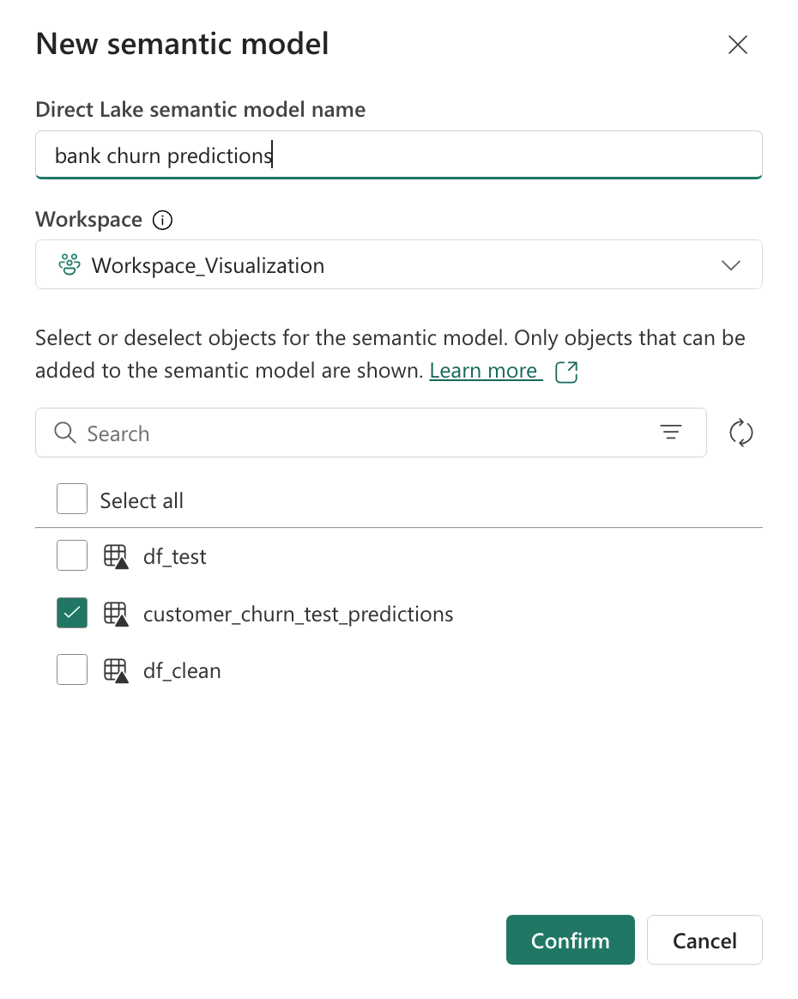

6. Select Confirm.

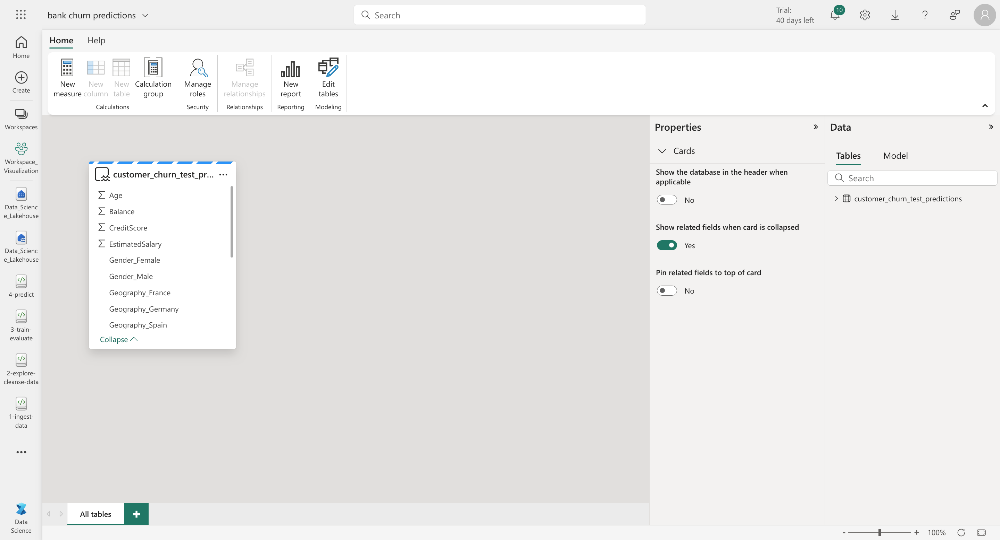

[Part 5....](#5)
<a id='5.2'></a>
## 5.2. Add new measures
Now add a few measures to the semantic model:

1. Add a new measure for the churn rate.

+ Select New measure in the top ribbon. This action adds a new item named Measure to the customer_churn_test_predictions dataset, and opens a formula bar above the table.
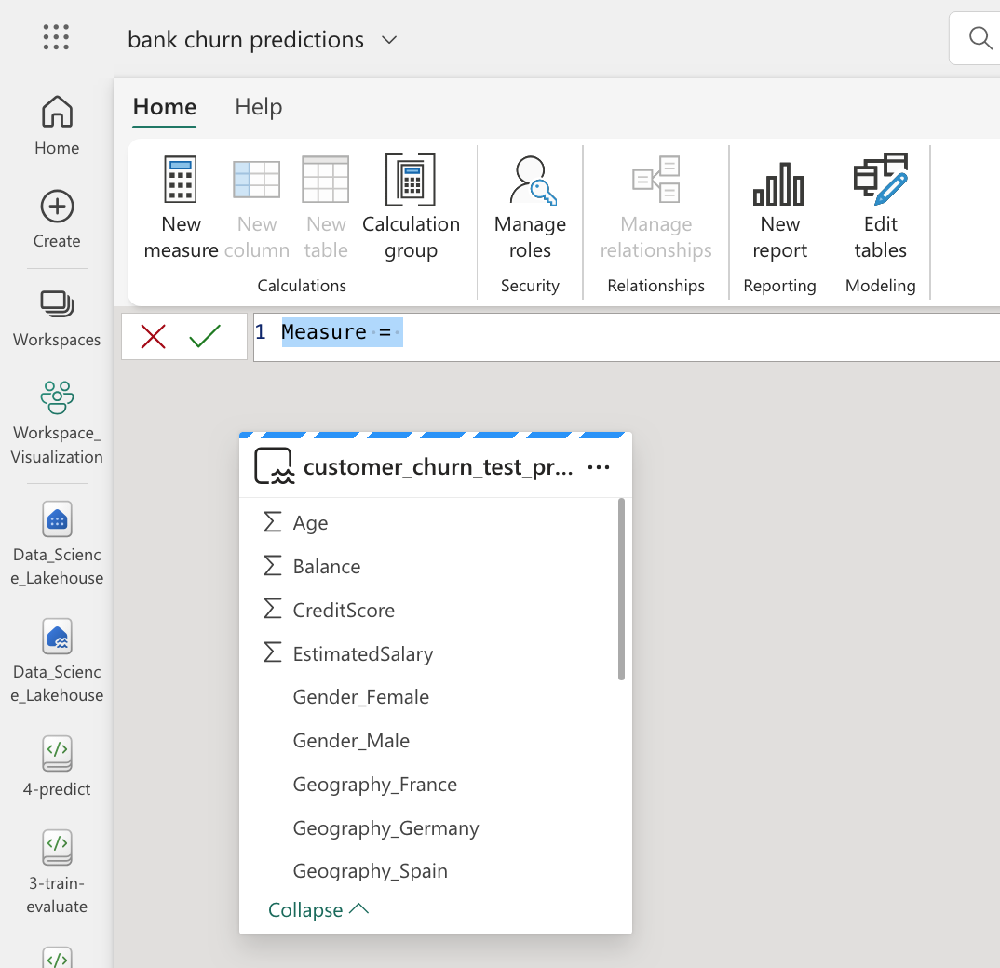

+ To determine the average predicted churn rate, replace Measure = in the formula bar with:
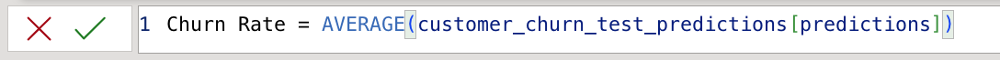

+ To apply the formula, select the check mark in the formula bar. The new measure appears in the data table. The calculator icon shows it was created as a measure.

+ Change the format from General to Percentage in the Properties panel.

+ Scroll down in the Properties panel to change the Decimal places to 1.

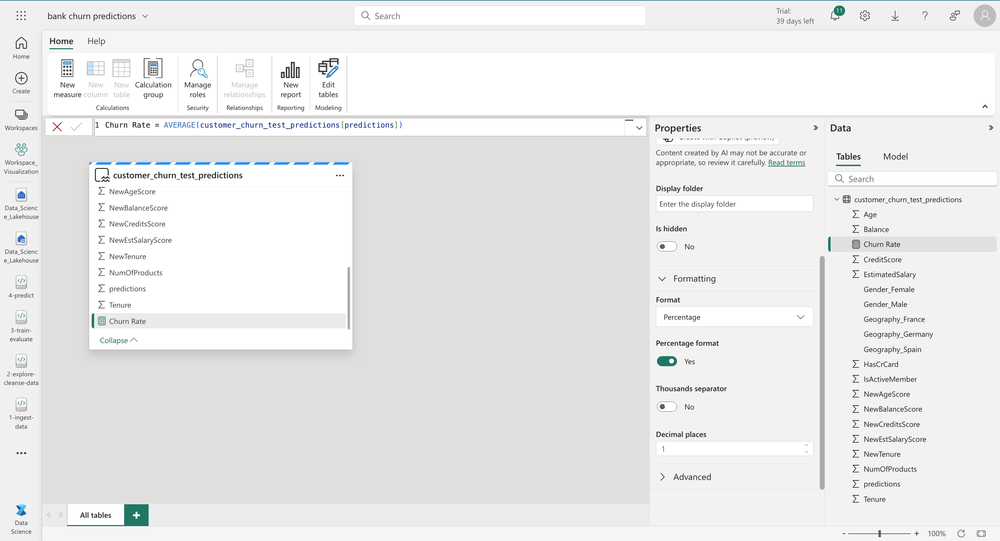

2. Add a new measure that counts the total number of bank customers. You'll need it for the rest of the new measures.

+ Select New measure in the top ribbon to add a new item named Measure to the customer_churn_test_predictions dataset. This action also opens a formula bar above the table.

+ Each prediction represents one customer. To determine the total number of customers, replace Measure = in the formula bar with:

+ Select the check mark in the formula bar to apply the formula.

3. Add the churn rate for Germany.

+ Select New measure in the top ribbon to add a new item named Measure to the customer_churn_test_predictions dataset. This action also opens a formula bar above the table.

+ To determine the churn rate for Germany, replace Measure = in the formula bar with:
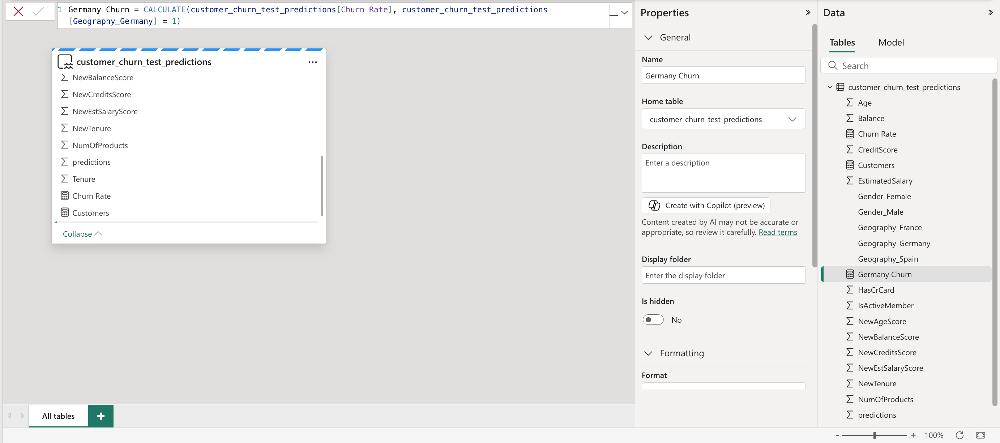

+ This filters the rows down to the ones with Germany as their geography (Geography_Germany equals one).

+ To apply the formula, select the check mark in the formula bar.

4. Repeat the above step to add the churn rates for France and Spain.

+ Spain's churn rate:
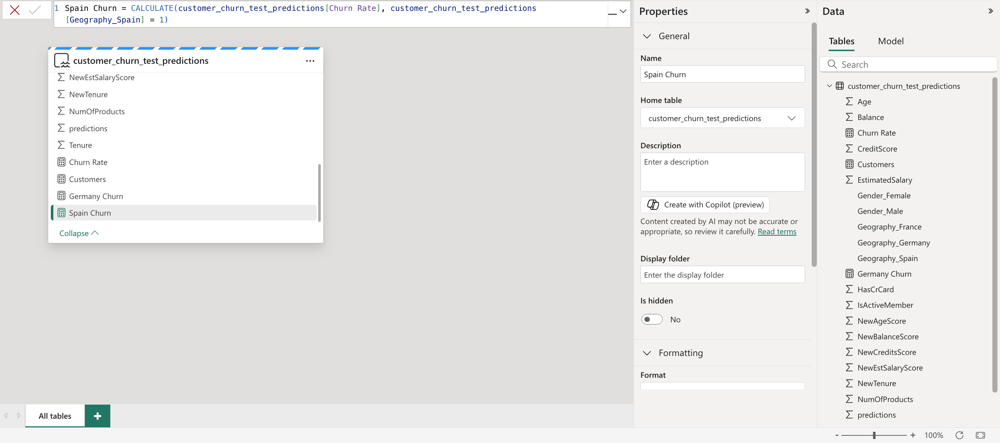

+ France's churn rate:
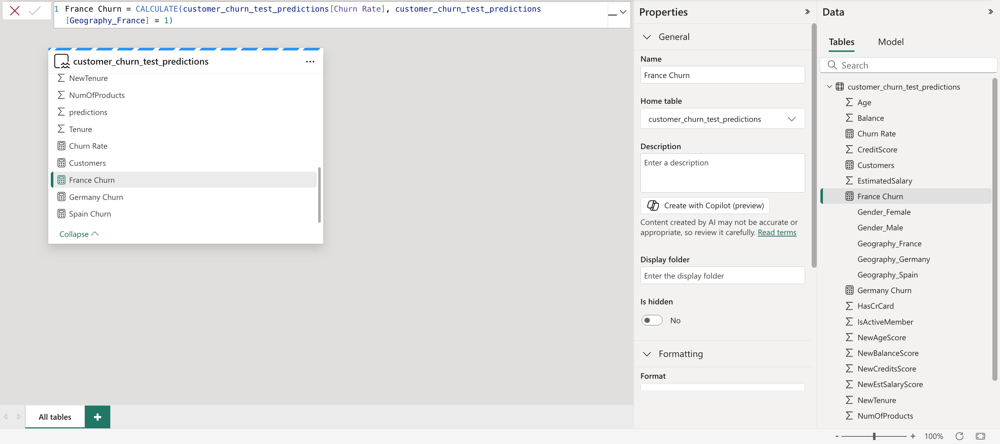
[Part 5....](#5)
<a id='5.3'></a>
## 5.3. Create new report
Once you're done with all operations, move on to the Power BI report authoring page by selecting Create report on the top ribbon.

Once the report page appears, add these visuals:

+ Select the text box on the top ribbon and enter a title for the report, such as "Bank Customer Churn". Change the font size and background color in the Format panel. Adjust the font size and color by selecting the text and using the format bar.

+ In the Visualizations panel, select the Card icon. From the Data pane, select Churn Rate. Change the font size and background color in the Format panel. Drag this visualization to the top right of the report.

+ In the Visualizations panel, select the Line and stacked column chart icon. Select age for the x-axis, Churn Rate for column y-axis, and Customers for the line y-axis.

+ In the Visualizations panel, select the Line and stacked column chart icon. Select NumOfProducts for x-axis, Churn Rate for column y-axis, and Customers for the line y-axis.

+ In the Visualizations panel, select the Stacked column chart icon. Select NewCreditsScore for x-axis and Churn Rate for y-axis.

+ Change the title "NewCreditsScore" to "Credit Score" in the Format panel.

+ In the Visualizations panel, select the Clustered column chart card. Select Germany Churn, Spain Churn, France Churn in that order for the y-axis.
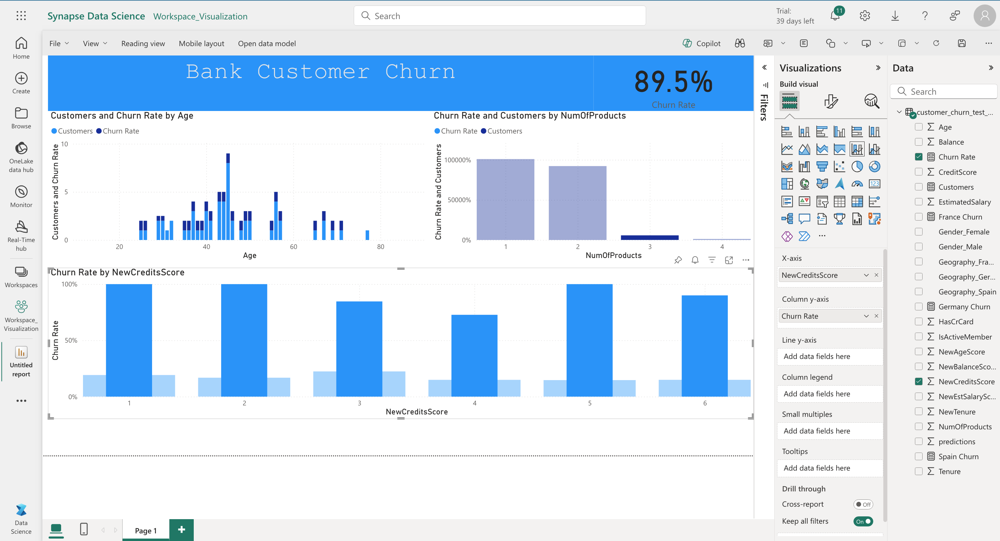
<div class="alert alert-block alert-info">Tip
+  Note

This report represents an illustrated example of how you might analyze the saved prediction results in Power BI. However, for a real customer churn use-case, the you may have to do more thorough ideation of what visualizations to create, based on syour subject matter expertise, and what your firm and business analytics team has standardized as metrics.</div>

The Power BI report shows:

+ Customers who use more than two of the bank products have a higher churn rate although few customers had more than two products. The bank should collect more data, but also investigate other features correlated with more products (see the plot in the bottom left panel).
+ Bank customers in Germany have a higher churn rate than in France and Spain (see the plot in the bottom right panel), which suggests that an investigation into what has encouraged customers to leave could be beneficial.
+ There are more middle aged customers (between 25-45) and customers between 45-60 tend to exit more.
+ Finally, customers with lower credit scores would most likely leave the bank for other financial institutes. The bank should look into ways that encourage customers with lower credit scores and account balances to stay with the bank.

[Introduction...](#0.0)

[Architecture...](#0)
## Next step
This completes the five part tutorial series. See other end-to-end sample tutorials: